# Extracting features from data

FMML Module 1, Lab 1<br>
 Module Coordinator: Thrupthi Ann John thrupthi.ann@research.iiit.ac.in <br>
 Release date: 4 October 2021 Monday <br>



In [ ]:
! pip install wikipedia

import wikipedia
import nltk
from nltk.util import ngrams
from collections import Counter
import matplotlib.pyplot as plt
import numpy as np
import re
import unicodedata
import plotly.express as px
import pandas as pd


  Created wheel for wikipedia: filename=wikipedia-1.4.0-py3-none-any.whl size=11696 sha256=0c87512dcf5c996edd7e1fc342dae682060c2a8c7b218f2037b9312c49a6f345
  Stored in directory: /root/.cache/pip/wheels/15/93/6d/5b2c68b8a64c7a7a04947b4ed6d89fb557dcc6bc27d1d7f3ba
Successfully built wikipedia


In [ ]:
import urllib
contents =urllib.request.urlopen('https://www.cdc.gov/climateandhealth/effects/default.htm')

st = ''
for lines in contents.readlines():
  st = st + str(lines, 'UTF-8')
print(st)


<!DOCTYPE html>
<html lang="en-us" class="theme-green cdc-page-type-content" >
<head>
	
<!-- Global / universal meta tags -->
<meta charset="utf-8" />
<meta http-equiv="X-UA-Compatible" content="IE=Edge" />
<meta content="width=device-width, initial-scale=1, shrink-to-fit=no" name="viewport" />
<meta name="mobile-web-app-capable" content="yes" />
<meta name="apple-mobile-web-app-capable" content="yes" />

<link rel="shortcut icon" href="/TemplatePackage/4.0/assets/imgs/favicon.ico">
<link rel="stylesheet prefetch" href="/TemplatePackage/contrib/libs/bootstrap/latest/css/bootstrap.min.css?_=71477" />
<link rel="stylesheet prefetch" href="/TemplatePackage/4.0/assets/css/app.min.css?_=71477" />
<link rel="stylesheet" media="print" href="/TemplatePackage/4.0/assets/css/print.min.css?_=71477" />
<!-- @prismcss@ -->
<script src="/JScript/metrics/adobe/VisitorAPI.js"></script>
<script src="/JScript/foresee-variables.js"></script>
<script>
/* ForeSee Embed Script v2.01
	// DO NOT MODIFY BELOW

# Part 1: Features of text
How do we apply machine learning on text? We can't directly use the text as input to our algorithms. We need to convert them to features. In this notebook, we will explore a simple way of converting text to features. 

Let us download a few documents off Wikipedia.

In [ ]:
topic1 = 'Giraffe'
topic2 = 'Elephant'
wikipedia.set_lang('en') 
eng1 = wikipedia.page(topic1).content
eng2 = wikipedia.page(topic2).content
wikipedia.set_lang('fr')
fr1 = wikipedia.page(topic1).content
fr2 = wikipedia.page(topic2).content

wikipedia.set_lang('fr') 
covid_fr = wikipedia.page("Coronavirus").content
wikipedia.set_lang('it') 
covid_it = wikipedia.page("Coronavirus").content


This is what the text looks like:

In [ ]:
covid_fr

'Les coronavirus (CoV) sont des virus qui constituent la sous-famille Orthocoronavirinae de la famille Coronaviridae. Le nom « coronavirus », du latin signifiant « virus à couronne », est dû à l\'apparence des virions sous un microscope électronique, avec une frange de grandes projections bulbeuses qui évoquent une couronne solaire.\nLes coronavirus sont munis d\'une enveloppe virale incluant une capside caractérisée par des protéines en forme de massue (appelées spicules). Ils ont un génome à ARN monocaténaire (c\'est-à-dire à un seul brin), de sens positif (groupe IV de la classification Baltimore), de 26 à 32 kilobases (ce qui en fait les plus grands génomes parmi les virus à ARN). Ils se classent parmi les Nidovirales, ordre de virus produisant un jeu imbriqué d\'ARNm sous-génomiques lors de l\'infection. Des spicules, une enveloppe, membrane et capside contribuent à la structure d\'ensemble de tous les coronavirus. Ils peuvent muter et se recombiner.\nLes chauves-souris et les ois

In [ ]:
covid_it

'Orthocoronavirinae è una sottofamiglia di virus, noti anche come coronavirus, della famiglia Coronaviridae, del sottordine Cornidovirineae, dell\'ordine Nidovirales. In passato era classificata come genere.\nSuddivisa nei generi (in passato sottogeneri) Alphacoronavirus, Betacoronavirus, Gammacoronavirus e Deltacoronavirus, questi includono genogruppi filogeneticamente compatti di RNA avvolto, a senso positivo, e con un nucleocapside di simmetria elicoidale. Alphacoronavirus e Betacoronavirus derivano dal pool genico dei pipistrelli.\nLa "dimensione genomica" dei coronavirus varia da circa 26 a 32 kilobasi, straordinariamente grande per un virus a RNA. Il loro numero sta crescendo rapidamente con diversi nuovi coronavirus scoperti di recente, tra cui SARS-CoV-1 scoperto nel 2002, MERS-CoV nel 2012 e SARS-CoV-2 scoperto nel 2019 a Wuhan, in Cina.\nIl nome "coronavirus" deriva dal termine latino corona, a sua volta derivato dal greco κορώνη (korṓnē, "ghirlanda"), che significa "corona" 

We need to clean this up a bit. Let us remove all the special characters and keep only 26 letters and space. Note that this will remove accented characters in French also. We are also removing all the numbers and spaces. So this is not an ideal solution.

In [ ]:
def cleanup(text):
    text = text.lower()  # make it lowercase
    text = re.sub('[^a-z]+', '', text) # only keep characters
    return text

In [ ]:
eng1 = cleanup(eng1)
eng2 = cleanup(eng2)
fr1 = cleanup(fr1)
fr2 = cleanup(fr2)
covid_it = cleanup(covid_it)
covid_fr = cleanup(covid_fr)

In [ ]:
print(covid_it)

orthocoronavirinaeunasottofamigliadivirusnotianchecomecoronavirusdellafamigliacoronaviridaedelsottordinecornidovirineaedellordinenidoviralesinpassatoeraclassificatacomegeneresuddivisaneigeneriinpassatosottogenerialphacoronavirusbetacoronavirusgammacoronavirusedeltacoronavirusquestiincludonogenogruppifilogeneticamentecompattidirnaavvoltoasensopositivoeconunnucleocapsidedisimmetriaelicoidalealphacoronavirusebetacoronavirusderivanodalpoolgenicodeipipistrelliladimensionegenomicadeicoronavirusvariadacircaakilobasistraordinariamentegrandeperunvirusarnailloronumerostacrescendorapidamentecondiversinuovicoronavirusscopertidirecentetracuisarscovscopertonelmerscovnelesarscovscopertonelawuhanincinailnomecoronavirusderivadalterminelatinocoronaasuavoltaderivatodalgrecokornghirlandachesignificacoronaoaureolacisiriferisceallespinuleproteinesformatedaivirionilaformainfettivadelvirusvisibilealmicroscopioelettronicochepresentaunaseriediglicoproteinesuperficialichedannounimmaginechericordaunacoronarealeou

In [ ]:
print(fr1)

lagirafegiraffacamelopardalisestuneespcedemammifresongulsartiodactylesdugroupedesruminantsvivantdanslessavanesafricainesetrpanduedutchadjusquenafriquedusudsonnomcommunvientdelarabezarfahmaislanimalfutanciennementappelcamloparddulatincameloparduscontractiondecameluschameauenraisondulongcouetdeparduslopardenraisondestachesrecouvrantsoncorpsaprsdesmillionsdannesdvolutionlagirafeaacquisuneanatomieuniqueavecuncouparticulirementallongquiluipermetnotammentdebrouterhautdanslesarbresneufpopulationssediffrenciantparleursrobesetformesonttdcritesparlesnaturalistesdepuislexixesicleparfoiscommeespcespartentiremaisgnralementconsidrescommesimplessousespcesjusquauxxiesiclecependantlataxonomiedesgirafesestactuellementdbattueparmilesscientifiqueslespceestconsidrecommevulnrableparluicnilyavaitindividusenetilnyenaplusqueensoitunediminutionapprochantenanstymologielesubstantiffminingirafeestunempruntlitaliengiraffaluimmeempruntlarabezurfapourlarabeclassiquezarfadescriptionilsagitdelanimalactuelleplusgrandenh

In [ ]:
st1 = ''
for i in (ngrams(eng2,16)):
  st1 = ''.join(i)
  print (st1)

Streaming output truncated to the last 5000 lines.
irearsundertheir
rearsundertheirc
earsundertheirch
arsundertheirchi
rsundertheirchin
sundertheirchins
undertheirchinsa
ndertheirchinsan
dertheirchinsand
ertheirchinsando
rtheirchinsandon
theirchinsandont
heirchinsandonth
eirchinsandonthe
irchinsandonthei
rchinsandontheir
chinsandontheirl
hinsandontheirle
insandontheirleg
nsandontheirlegs
sandontheirlegsw
andontheirlegswi
ndontheirlegswit
dontheirlegswith
ontheirlegswithm
ntheirlegswithme
theirlegswithmet
heirlegswithmeta
eirlegswithmetal
irlegswithmetalt
rlegswithmetalti
legswithmetaltip
egswithmetaltipp
gswithmetaltippe
swithmetaltipped
withmetaltippedp
ithmetaltippedpr
thmetaltippedpro
hmetaltippedprod
metaltippedprods
etaltippedprodsc
taltippedprodsca
altippedprodscal
ltippedprodscall
tippedprodscalle
ippedprodscalled
ppedprodscalledb
pedprodscalledbu
edprodscalledbul
dprodscalledbull
prodscalledbullh
rodscalledbullho
odscalledbullhoo
dscalledbullhook
scalledbullhooks
calledbullhook

In [ ]:

for i in (ngrams(eng1,16)):
  print (i)
import enchant 

Streaming output truncated to the last 5000 lines.
('h', 'a', 'v', 'e', 'a', 'l', 's', 'o', 'b', 'e', 'e', 'n', 'u', 's', 'e', 'd')
('a', 'v', 'e', 'a', 'l', 's', 'o', 'b', 'e', 'e', 'n', 'u', 's', 'e', 'd', 'f')
('v', 'e', 'a', 'l', 's', 'o', 'b', 'e', 'e', 'n', 'u', 's', 'e', 'd', 'f', 'o')
('e', 'a', 'l', 's', 'o', 'b', 'e', 'e', 'n', 'u', 's', 'e', 'd', 'f', 'o', 'r')
('a', 'l', 's', 'o', 'b', 'e', 'e', 'n', 'u', 's', 'e', 'd', 'f', 'o', 'r', 's')
('l', 's', 'o', 'b', 'e', 'e', 'n', 'u', 's', 'e', 'd', 'f', 'o', 'r', 's', 'o')
('s', 'o', 'b', 'e', 'e', 'n', 'u', 's', 'e', 'd', 'f', 'o', 'r', 's', 'o', 'm')
('o', 'b', 'e', 'e', 'n', 'u', 's', 'e', 'd', 'f', 'o', 'r', 's', 'o', 'm', 'e')
('b', 'e', 'e', 'n', 'u', 's', 'e', 'd', 'f', 'o', 'r', 's', 'o', 'm', 'e', 's')
('e', 'e', 'n', 'u', 's', 'e', 'd', 'f', 'o', 'r', 's', 'o', 'm', 'e', 's', 'c')
('e', 'n', 'u', 's', 'e', 'd', 'f', 'o', 'r', 's', 'o', 'm', 'e', 's', 'c', 'i')
('n', 'u', 's', 'e', 'd', 'f', 'o', 'r', 's', 'o', 'm', 'e

In [ ]:
print(Counter(ngrams(eng1,6)).keys())



dict_keys([('g', 'i', 'r', 'a', 'f', 'f'), ('i', 'r', 'a', 'f', 'f', 'e'), ('r', 'a', 'f', 'f', 'e', 's'), ('a', 'f', 'f', 'e', 's', 'g'), ('f', 'f', 'e', 's', 'g', 'e'), ('f', 'e', 's', 'g', 'e', 'n'), ('e', 's', 'g', 'e', 'n', 'u'), ('s', 'g', 'e', 'n', 'u', 's'), ('g', 'e', 'n', 'u', 's', 'g'), ('e', 'n', 'u', 's', 'g', 'i'), ('n', 'u', 's', 'g', 'i', 'r'), ('u', 's', 'g', 'i', 'r', 'a'), ('s', 'g', 'i', 'r', 'a', 'f'), ('i', 'r', 'a', 'f', 'f', 'a'), ('r', 'a', 'f', 'f', 'a', 'a'), ('a', 'f', 'f', 'a', 'a', 'r'), ('f', 'f', 'a', 'a', 'r', 'e'), ('f', 'a', 'a', 'r', 'e', 'a'), ('a', 'a', 'r', 'e', 'a', 'f'), ('a', 'r', 'e', 'a', 'f', 'r'), ('r', 'e', 'a', 'f', 'r', 'i'), ('e', 'a', 'f', 'r', 'i', 'c'), ('a', 'f', 'r', 'i', 'c', 'a'), ('f', 'r', 'i', 'c', 'a', 'n'), ('r', 'i', 'c', 'a', 'n', 'a'), ('i', 'c', 'a', 'n', 'a', 'r'), ('c', 'a', 'n', 'a', 'r', 't'), ('a', 'n', 'a', 'r', 't', 'i'), ('n', 'a', 'r', 't', 'i', 'o'), ('a', 'r', 't', 'i', 'o', 'd'), ('r', 't', 'i', 'o', 'd', 'a'

In [ ]:
print(Counter(ngrams(eng1,6)).values())

dict_values([215, 188, 129, 6, 1, 1, 1, 1, 4, 4, 4, 6, 28, 19, 3, 2, 1, 1, 1, 1, 1, 3, 15, 6, 1, 1, 1, 2, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 3, 2, 2, 2, 2, 1, 7, 9, 9, 2, 2, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 3, 8, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 2, 2, 12, 4, 1, 1, 2, 1, 11, 27, 1, 1, 3, 2, 3, 4, 3, 2, 1, 1, 1, 1, 8, 5, 11, 6, 2, 1, 1, 1, 2, 3, 3, 3, 7, 8, 19, 5, 5, 2, 3, 3, 1, 1, 3, 1, 1, 14, 6, 1, 1, 1, 1, 1, 1, 1, 3, 3, 2, 1, 1, 1, 1, 1, 3, 3, 9, 38, 38, 2, 1, 1, 8, 1, 1, 1, 1, 1, 6, 6, 6, 6, 6, 5, 5, 5, 7, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 8, 8, 8, 3, 1, 1, 1, 2, 9, 9, 2, 3, 3, 1, 1, 3, 3, 3, 3, 3, 3, 3, 3, 6, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 17, 2, 1, 1, 1, 1, 1, 1, 11, 11, 3, 3, 2, 2, 2, 4, 4, 4, 4, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 5, 5, 5, 1, 1, 1, 1, 1, 7, 7, 5, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 3, 3, 3, 2, 4, 4, 4, 1, 1, 1, 1, 1, 3, 3, 2, 1, 1, 1, 3, 1

Now let us calculate the frequency of the character n-grams. N-grams are groups of characters of size n. A unigram is a single character and a bigram is a group of two characters and so on. 

Let us count the frequency of each character in a text and plot it in a histogram.

In [ ]:
# convert a tuple of characters to a string
def tuple2string(tup):
    st = ''
    for ii in tup:
        st = st + ii
    return st

# convert a tuple of tuples to a list of strings
def key2string(keys):
    return [tuple2string(i) for i in keys]

# plot the histogram
def plothistogram(ngram):
    keys = key2string(ngram.keys()) 
    values = list(ngram.values())
  
  # sort the keys in alphabetic order
    combined = zip(keys, values)
    zipped_sorted = sorted(combined, key=lambda x: x[0])
    keys, values = map(list, zip(*zipped_sorted))
    plt.bar(keys, values)

Let us compare the histograms of English pages and French pages. Can you spot a difference?

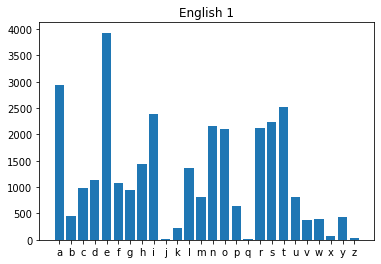

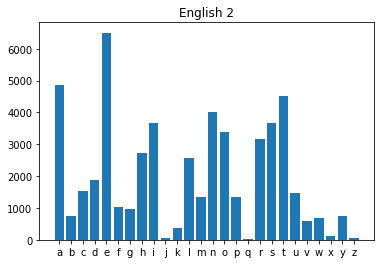

In [ ]:
unigram_eng1 = Counter(ngrams(eng1,1))
plothistogram(unigram_eng1)
plt.title('English 1')
plt.show()
unigram_eng2 = Counter(ngrams(eng2,1))
plothistogram(unigram_eng2)
plt.title('English 2')
plt.show()

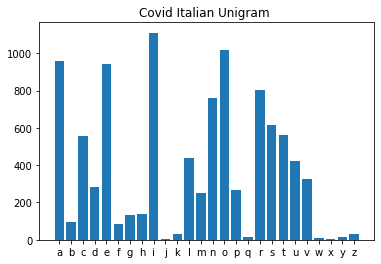

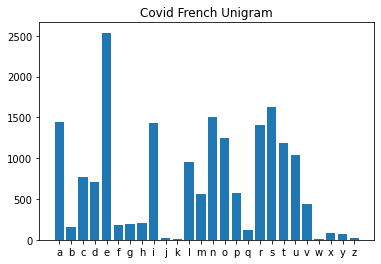

In [ ]:
unigram_covid_it = Counter(ngrams(covid_it,1))
plothistogram(unigram_covid_it)
plt.title('Covid Italian Unigram ')
plt.show()
unigram_covid_fr = Counter(ngrams(covid_fr,1))
plothistogram(unigram_covid_fr)
plt.title('Covid French Unigram')
plt.show()

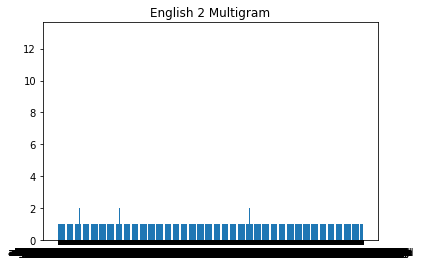

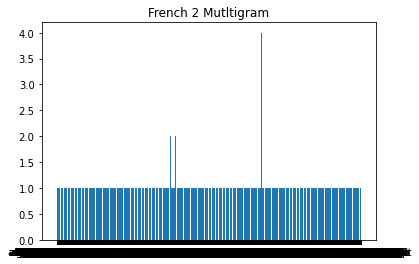

In [ ]:
multigram_eng2 = Counter(ngrams(eng2,16))
plothistogram(multigram_eng2)
plt.title('English 2 Multigram')
plt.show()
multigram_fr2 = Counter(ngrams(fr2,16))
plothistogram(multigram_fr2)
plt.title('French 2 Mutltigram')
plt.show()

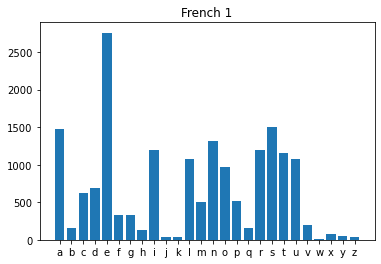

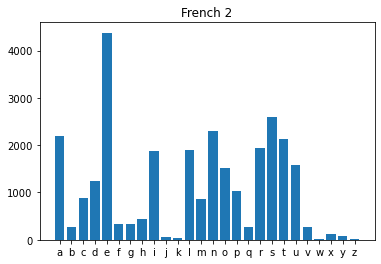

In [ ]:
unigram_fr1 = Counter(ngrams(fr1,1))
plothistogram(unigram_fr1)
plt.title('French 1')
plt.show()
unigram_fr2 = Counter(ngrams(fr2,1))
plothistogram(unigram_fr2)
plt.title('French 2')
plt.show()

We can see that the unigrams for French and English are very similar. So this is not a good feature if we want to distinguish between English and French. Let us look at bigrams.

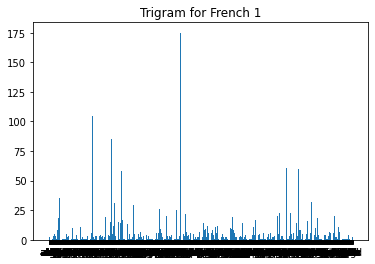

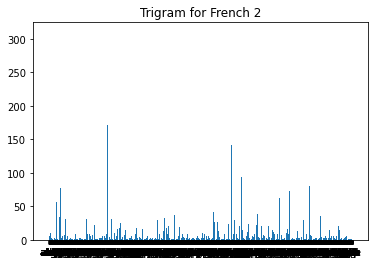

In [ ]:
# This I had tried for trigram, taking three characters at a time

trigram_fr1 = Counter(ngrams(fr1,3))
plothistogram(trigram_fr1)
plt.title('Trigram for French 1')
plt.show()
trigram_fr2 = Counter(ngrams(fr2,3))
plothistogram(trigram_fr2)
plt.title('Trigram for French 2')
plt.show()

In [ ]:
trigram_fr1

Counter({('l', 'a', 'g'): 55,
         ('a', 'g', 'i'): 52,
         ('g', 'i', 'r'): 125,
         ('i', 'r', 'a'): 128,
         ('r', 'a', 'f'): 129,
         ('a', 'f', 'e'): 99,
         ('f', 'e', 'g'): 2,
         ('e', 'g', 'i'): 34,
         ('a', 'f', 'f'): 20,
         ('f', 'f', 'a'): 14,
         ('f', 'a', 'c'): 14,
         ('a', 'c', 'a'): 20,
         ('c', 'a', 'm'): 17,
         ('a', 'm', 'e'): 25,
         ('m', 'e', 'l'): 36,
         ('e', 'l', 'o'): 32,
         ('l', 'o', 'p'): 24,
         ('o', 'p', 'a'): 19,
         ('p', 'a', 'r'): 77,
         ('a', 'r', 'd'): 30,
         ('r', 'd', 'a'): 20,
         ('d', 'a', 'l'): 19,
         ('a', 'l', 'i'): 31,
         ('l', 'i', 's'): 25,
         ('i', 's', 'e'): 20,
         ('s', 'e', 's'): 31,
         ('e', 's', 't'): 81,
         ('s', 't', 'u'): 8,
         ('t', 'u', 'n'): 23,
         ('u', 'n', 'e'): 54,
         ('n', 'e', 'e'): 6,
         ('e', 'e', 's'): 29,
         ('e', 's', 'p'): 71,
         (

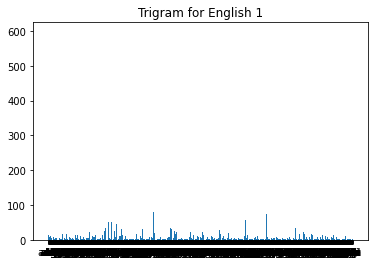

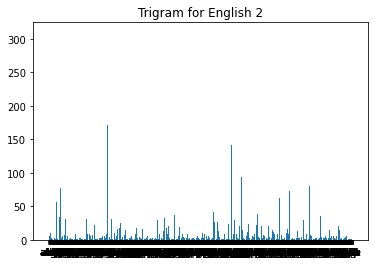

In [ ]:
trigram_eng1 = Counter(ngrams(eng1,3))
plothistogram(trigram_eng1)
plt.title('Trigram for English 1')
plt.show()
trigram_eng2 = Counter(ngrams(eng2,3))
plothistogram(trigram_fr2)
plt.title('Trigram for English 2')
plt.show()

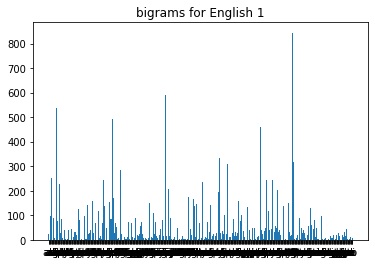

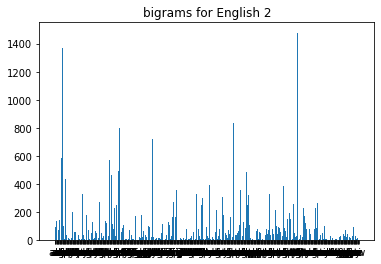

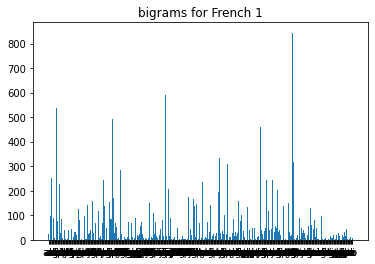

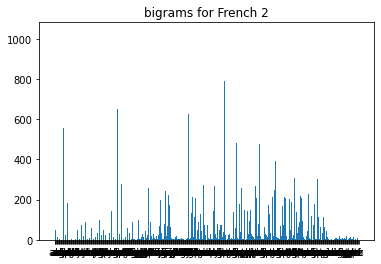

In [ ]:
bigram_eng1 = Counter(ngrams(eng1,2)) # bigrams
plothistogram(bigram_eng1)
plt.title('bigrams for English 1')
plt.show()

bigram_eng2 = Counter(ngrams(eng2,2))
plothistogram(bigram_eng2)
plt.title('bigrams for English 2')
plt.show()

bigram_fr1 = Counter(ngrams(fr1,2))
plothistogram(bigram_eng1)
plt.title('bigrams for French 1')
plt.show()

bigram_fr2 = Counter(ngrams(fr2,2))
plothistogram(bigram_fr2)
plt.title('bigrams for French 2')
plt.show()

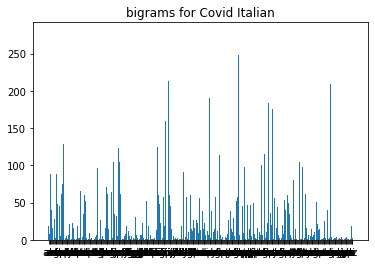

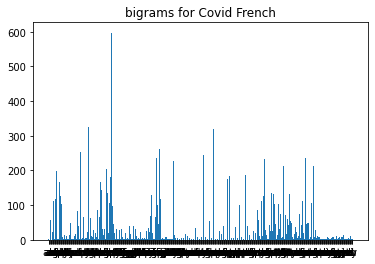

In [ ]:
bigram_covid_it = Counter(ngrams(covid_it,2)) # bigrams
plothistogram(bigram_covid_it)
plt.title('bigrams for Covid Italian')
plt.show()

bigram_covid_fr = Counter(ngrams(covid_fr,2))
plothistogram(bigram_covid_fr)
plt.title('bigrams for Covid French')
plt.show()


Another way to visualize bigrams is to use a 2-dimensional graph.

In [ ]:
def plotbihistogram(ngram):
    freq = np.zeros((26,26))
    for i in range(26):
        for j in range(26):
            freq[i,j] = ngram[(chr(ord('a')+i), chr(ord('a')+j))]
            
    plt.imshow(freq, cmap = 'jet')
    
    return freq

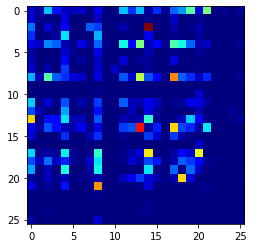

In [ ]:
bicovid_it = plotbihistogram(bigram_covid_it)
plt.show()

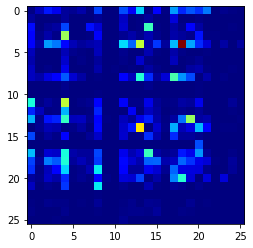

In [ ]:
bicovid_fr = plotbihistogram(bigram_covid_fr)
plt.show()

In [ ]:
chr(ord('a')+3)

'd'

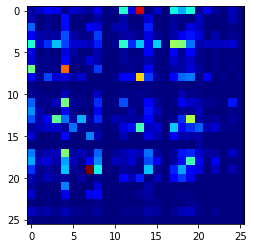

In [ ]:
bieng2 = plotbihistogram(bigram_eng2)
plt.show()

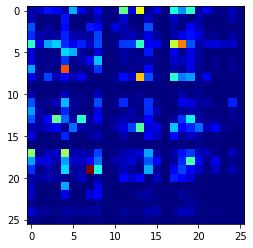

In [ ]:
bieng1 = plotbihistogram(bigram_eng1)
plt.show()

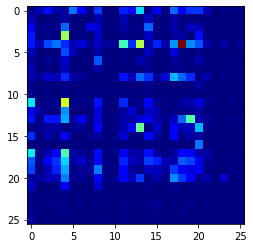

In [ ]:
bifr1 = plotbihistogram(bigram_fr1)
plt.show()


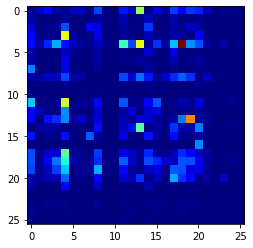

In [ ]:
bifr2 = plotbihistogram(bigram_fr2)

In [ ]:
ngram=bigram_eng1
freq = np.zeros((26,26))
for i in range(26):
  for j in range(26):
    freq[i,j] = ngram[(chr(ord('a')+i), chr(ord('a')+j))]
    print(ngram, freq[i,j])


Counter({('t', 'h'): 844, ('h', 'e'): 697, ('e', 's'): 654, ('i', 'n'): 592, ('a', 'n'): 539, ('e', 'r'): 494, ('r', 'e'): 461, ('r', 'a'): 435, ('n', 'd'): 401, ('a', 'l'): 396, ('o', 'n'): 376, ('s', 't'): 371, ('a', 't'): 346, ('e', 'n'): 344, ('e', 'a'): 343, ('i', 'r'): 337, ('n', 'g'): 334, ('a', 'r'): 320, ('t', 'i'): 318, ('n', 't'): 307, ('t', 'e'): 287, ('f', 'e'): 284, ('e', 'd'): 279, ('o', 'r'): 270, ('g', 'i'): 269, ('l', 'e'): 259, ('f', 'f'): 253, ('a', 'f'): 251, ('t', 'o'): 248, ('v', 'e'): 246, ('s', 'a'): 242, ('e', 'c'): 242, ('h', 'a'): 242, ('r', 'o'): 242, ('s', 'e'): 241, ('i', 't'): 237, ('m', 'a'): 236, ('a', 's'): 227, ('i', 's'): 208, ('s', 'i'): 201, ('o', 'f'): 197, ('n', 'e'): 194, ('o', 'u'): 189, ('n', 'a'): 177, ('l', 'a'): 173, ('c', 'a'): 172, ('e', 't'): 172, ('s', 'o'): 172, ('i', 'o'): 169, ('c', 'o'): 169, ('l', 'i'): 167, ('e', 'i'): 167, ('i', 'c'): 161, ('t', 's'): 161, ('d', 'i'): 160, ('o', 'm'): 159, ('r', 'i'): 157, ('e', 'm'): 156, ('g',

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



4.0
Counter({('t', 'h'): 844, ('h', 'e'): 697, ('e', 's'): 654, ('i', 'n'): 592, ('a', 'n'): 539, ('e', 'r'): 494, ('r', 'e'): 461, ('r', 'a'): 435, ('n', 'd'): 401, ('a', 'l'): 396, ('o', 'n'): 376, ('s', 't'): 371, ('a', 't'): 346, ('e', 'n'): 344, ('e', 'a'): 343, ('i', 'r'): 337, ('n', 'g'): 334, ('a', 'r'): 320, ('t', 'i'): 318, ('n', 't'): 307, ('t', 'e'): 287, ('f', 'e'): 284, ('e', 'd'): 279, ('o', 'r'): 270, ('g', 'i'): 269, ('l', 'e'): 259, ('f', 'f'): 253, ('a', 'f'): 251, ('t', 'o'): 248, ('v', 'e'): 246, ('s', 'a'): 242, ('e', 'c'): 242, ('h', 'a'): 242, ('r', 'o'): 242, ('s', 'e'): 241, ('i', 't'): 237, ('m', 'a'): 236, ('a', 's'): 227, ('i', 's'): 208, ('s', 'i'): 201, ('o', 'f'): 197, ('n', 'e'): 194, ('o', 'u'): 189, ('n', 'a'): 177, ('l', 'a'): 173, ('c', 'a'): 172, ('e', 't'): 172, ('s', 'o'): 172, ('i', 'o'): 169, ('c', 'o'): 169, ('l', 'i'): 167, ('e', 'i'): 167, ('i', 'c'): 161, ('t', 's'): 161, ('d', 'i'): 160, ('o', 'm'): 159, ('r', 'i'): 157, ('e', 'm'): 156, (

[[ 24.  56. 120.  96.  32. 251.  78.  16.  88.   2.   9. 396.  72. 539.
    7.  77.   1. 320. 227. 346.  26.  84.  14.   6.  43.   2.]
 [ 41.   1.   3.   1. 120.   4.   1.   0.  41.   4.   0.  60.   1.   1.
   44.   1.   0.  51.  12.   1.  30.   0.   0.   0.  30.   0.]
 [172.   0.  21.   0. 109.   0.   1. 125.  99.   0.  79.  34.   8.   3.
  169.   1.   0.  22.   6.  95.  37.   4.   2.   0.   2.   0.]
 [140.  38.  23.  27. 134.  38.  25.  21. 160.   0.   5.  28.  40.  17.
   70.  21.   1.  32.  77. 118.  70.   9.  16.   0.  24.   4.]
 [343.  70. 242. 279. 139.  87. 130.  50. 167.   1.  13. 151. 156. 344.
   84.  85.   8. 494. 654. 172.  29.  61.  67.  48.  54.   2.]
 [ 66.   9.   5.   6. 284. 253.  22.   5.  63.   0.   1.  24.  12.   5.
  125.   3.   0.  85.  13.  72.  20.   3.   3.   0.   1.   0.]
 [ 70.   7.  11.  10. 151.   7.  31.  89. 269.   2.   0.  20.  10.  17.
   23.   7.   0.  58.  40.  74.  23.   2.   9.   0.  11.   0.]
 [242.   7.  15.   3. 697.   8.   6.  11. 148.   1.   1

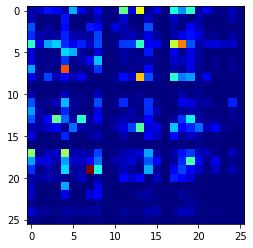

In [ ]:

ngram=bigram_eng1
freq = np.zeros((26,26))
for i in range(26):
  for j in range(26):
    freq[i,j] = ngram[(chr(ord('a')+i), chr(ord('a')+j))]
print(freq)

plt.imshow(freq, cmap = 'jet')
      

In [ ]:
# plotting for trigrams 
freq1 = np.zeros((26,26,26))
def plottrihistogram(trigram_eng1):
   
    for i in range(26):
        for j in range(26):
          for k in range(26):
            freq1[i,j,k] = ngram[(chr(ord('a')+i), chr(ord('a')+j), chr(ord('a')+k))]
            
    #plt.imshow(freq1, cmap = 'jet')
    print(freq1)
    return freq1

In [ ]:
# plotting for trigrams 
freq1 = np.zeros((26,26,26))
for i in range(26):
  for j in range(26):
    for k in range(26):
      freq1[i,j,k] = trigram_eng1[(chr(ord('a')+i), chr(ord('a')+j), chr(ord('a')+k))]
                
#plt.imshow(freq1.reshape(26,26))
#print(freq1)
   

Let us look at the top 10 ngrams for each text. 

In [ ]:
from IPython.core.debugger import set_trace

def ind2tup(ind):
    ind = int(ind)
    i = int(ind/26)
    j = int(ind%26)
    return (chr(ord('a')+i), chr(ord('a')+j))

def ShowTopN(bifreq, n=10):
    f = bifreq.flatten()
    arg = np.argsort(-f)
    for ii in range(n):
        print(f'{ind2tup(arg[ii])} : {f[arg[ii]]}')


In [ ]:
print('\nEnglish 1:')
ShowTopN(bieng1)
print('\nFrench 1:')
ShowTopN(bifr1)
print('\nFrench 2:')
ShowTopN(bifr2)
print('\nEnglish 2:')
ShowTopN(bieng2)

print('\n Covid Italian:')
ShowTopN(bicovid_it)
print('\n Covid French:')
ShowTopN(bicovid_fr)




English 1:
('t', 'h') : 844.0
('h', 'e') : 697.0
('e', 's') : 654.0
('i', 'n') : 592.0
('a', 'n') : 539.0
('e', 'r') : 494.0
('r', 'e') : 461.0
('r', 'a') : 435.0
('n', 'd') : 401.0
('a', 'l') : 396.0

French 1:
('e', 's') : 645.0
('l', 'e') : 394.0
('e', 'n') : 367.0
('d', 'e') : 349.0
('o', 'n') : 309.0
('n', 't') : 289.0
('r', 'e') : 289.0
('e', 'l') : 276.0
('r', 'a') : 230.0
('l', 'a') : 228.0

French 2:
('e', 's') : 1031.0
('n', 't') : 792.0
('d', 'e') : 656.0
('e', 'n') : 649.0
('l', 'e') : 625.0
('a', 'n') : 555.0
('o', 'n') : 481.0
('r', 'e') : 477.0
('e', 'l') : 438.0
('s', 'e') : 392.0

English 2:
('t', 'h') : 1478.0
('a', 'n') : 1368.0
('h', 'e') : 1189.0
('i', 'n') : 1014.0
('n', 't') : 833.0
('e', 'r') : 800.0
('e', 's') : 752.0
('r', 'e') : 750.0
('l', 'e') : 724.0
('h', 'a') : 716.0

 Covid Italian:
('c', 'o') : 278.0
('o', 'n') : 248.0
('i', 'r') : 213.0
('v', 'i') : 209.0
('n', 'a') : 191.0
('o', 'r') : 190.0
('u', 's') : 188.0
('r', 'o') : 184.0
('r', 'u') : 175.0
(

We observe that the bigrams are similar across different topics but different across languages. Thus, the bigram frequency is a good feature for distinguishing languages, but not for distinguishing topics. 

Thus, we were able to convert a many-dimensional input (the text) to 26 dimesions (unigrams) or 26*26 dimensions (bigrams).


A few ways to explore:
1. Try with different languages.
Ans ** Tried in Italian and English **

2. The topics we used are quite similar, wikipedia articles of 'elephant' and 'giraffe'. What happens if we use very different topics? What if we use text from another source than Wikipedia?

** topic: corona virus ** 

** we were able to to visualize two different graphs in bigram when using corona virus for italian and french, this looks like this will be one amoung the best features to classify between french and italian pages about corona virus ** 

 **import urllib
contents =urllib.request.urlopen('https://www.cdc.gov/climateandhealth/effects/default.htm')

st = ''
for lines in contents.readlines():
  st = st + str(lines, 'UTF-8')
print(st)**


There are other packages like beautifulsoup, strips, etc which can be used to extract contents from the webpages


3. How can we use and visualize trigrams and higher n-grams?


3. How can we use and visualize trigrams and higher n-grams?

Ans As I had read imshow() can be applied on 2D np array, when we go for 
trigrams and higher it become 3D and higher we cannot use imshow() to
visualize the frequency of trigrams or higher

**bold text**







# Part 2: Written numbers

We will use a subset of the MNIST dataset. Each input character is represented in a 28*28 array. Let us see if we can extract some simple features from these images which can help us distinguish between the digits.

Load the dataset:

In [ ]:
from keras.datasets import mnist
 
#loading the dataset
(train_X, train_y), (test_X, test_y) = mnist.load_data()



Extract a subset of the data for our experiment:

In [ ]:
no1 = train_X[train_y==1,:,:]
no0 = train_X[train_y==0,:,:]
no2 = train_X[train_y==2,:,:]
no3 = train_X[train_y==3,:,:]

Let us visualize a few images here:

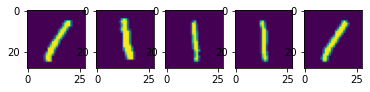

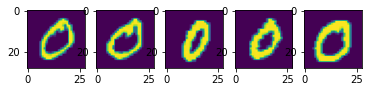

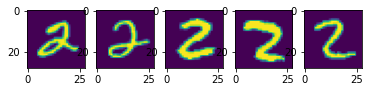

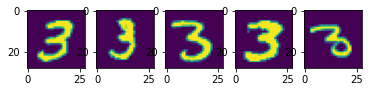

In [ ]:
for ii in range(5):
    plt.subplot(1, 5, ii+1)
    plt.imshow(no1[ii,:,:])
plt.show()

for ii in range(5):
    plt.subplot(1, 5, ii+1)
    plt.imshow(no0[ii,:,:])
plt.show()
for ii in range(5):
    plt.subplot(1, 5, ii+1)
    plt.imshow(no2[ii,:,:])
plt.show()
for ii in range(5):
    plt.subplot(1, 5, ii+1)
    plt.imshow(no3[ii,:,:])
plt.show()

suNow, let us start with a simple feature: the sum of all pixels and see how good this feature is.

In [ ]:
sum1 = np.sum(no1 > 0, (1,2)) # threshold before adding up
sum0 = np.sum(no0 > 0, (1,2))
sum2 = np.sum(no2 > 0, (1,2))
sum3 = np.sum(no3 > 0, (1,2))

In [ ]:
sum1 = np.sum(no1, (1,2)) # threshold before adding up
sum0 = np.sum(no0, (1,2))
sum2 = np.sum(no2, (1,2))
sum3 = np.sum(no3, (1,2))

Let us visualize how good this feature is: (X-axis is mean, y-axis is the digit)

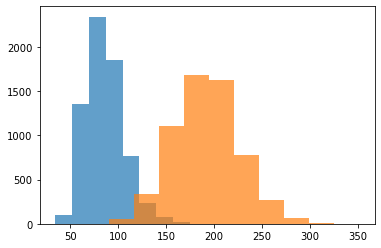

In [ ]:
plt.hist(sum1, alpha=0.7);
plt.hist(sum0, alpha=0.7);

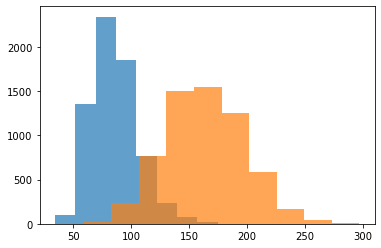

In [ ]:
plt.hist(sum1, alpha=0.7);

plt.hist(sum3, alpha=0.7);

We can already see that this feature separates the two classes quite well.

Let us look at another, more complicated feature. We will count the number black pixels that are surrounded on four sides by non-black pixels, or "hole pixels".

In [ ]:
def cumArray(img):
    img2 = img.copy()
    for ii in range(1, img2.shape[1]):
        img2[ii,:] = img2[ii,:] + img2[ii-1,:]  # for every row, add up all the rows above it.
    img2 = img2>0
    return img2

def getHolePixels(img):
    im1 = cumArray(img)
    im2 = np.rot90(cumArray(np.rot90(img)), 3) # rotate and cumulate it again for differnt direction
    im3 = np.rot90(cumArray(np.rot90(img, 2)), 2)
    im4 = np.rot90(cumArray(np.rot90(img, 3)), 1)
    hull =  im1 & im2 & im3 & im4 # this will create a binary image with all the holes filled in.
    hole = hull & ~ (img>0) # remove the original digit to leave behind the holes
    return hole




Visualize a few:

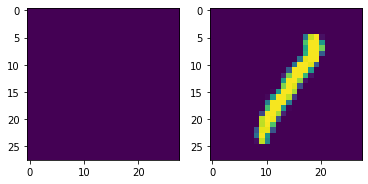

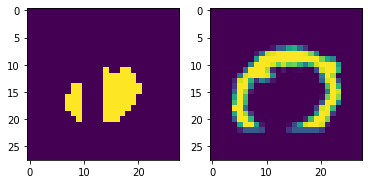

In [ ]:
imgs = [no1[456,:,:],  no0[456,:,:]]
for img in imgs:
    plt.subplot(1,2,1)
    plt.imshow(getHolePixels(img))
    plt.subplot(1,2,2)
    plt.imshow(img)
    plt.show()

Now let us plot the number of hole pixels and see how this feature behaves

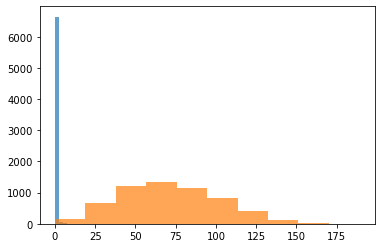

In [ ]:
hole1 = np.array([getHolePixels(i).sum() for i in no1])
hole0 = np.array([getHolePixels(i).sum() for i in no0])
  
plt.hist(hole1, alpha=0.7);
plt.hist(hole0, alpha=0.7);

This feature works even better to distinguish between one and zero. 


Now let us try the number of pixels in the 'hull' or the number with the holes filled in:

In [ ]:
def getHullPixels(img):
    im1 = cumArray(img)
    im2 = np.rot90(cumArray(np.rot90(img)), 3) # rotate and cumulate it again for differnt direction
    im3 = np.rot90(cumArray(np.rot90(img, 2)), 2)
    im4 = np.rot90(cumArray(np.rot90(img, 3)), 1)
    hull =  im1 & im2 & im3 & im4 # this will create a binary image with all the holes filled in.
    return hull


In [ ]:
im1 = cumArray(img)
print(im1)

[[False False False False False False False False False False False False
  False False False False False False False False False False False False
  False False False False]
 [False False False False False False False False False False False False
  False False False False False False False False False False False False
  False False False False]
 [False False False False False False False False False False False False
  False False False False False False False False False False False False
  False False False False]
 [False False False False False False False False False False False False
  False False False False False False False False False False False False
  False False False False]
 [False False False False False False False False False False False False
  False False False False False False False False False False False False
  False False False False]
 [False False False False False False False False False False False False
  False False False False False False False False F

In [ ]:
im2 = np.rot90(cumArray(np.rot90(img)), 3)
print(im2)

[[False False False False False False False False False False False False
  False False False False False False False False False False False False
  False False False False]
 [False False False False False False False False False False False False
  False False False False False False False False False False False False
  False False False False]
 [False False False False False False False False False False False False
  False False False False False False False False False False False False
  False False False False]
 [False False False False False False False False False False False False
  False False False False False False False False False False False False
  False False False False]
 [False False False False False False False False False False False False
  False False False False False False False False False False False False
  False False False False]
 [False False False False False False False False False False False False
  False False False False False False False False F

In [ ]:
hull1 = im1 & im2
print(hull1)

[[False False False False False False False False False False False False
  False False False False False False False False False False False False
  False False False False]
 [False False False False False False False False False False False False
  False False False False False False False False False False False False
  False False False False]
 [False False False False False False False False False False False False
  False False False False False False False False False False False False
  False False False False]
 [False False False False False False False False False False False False
  False False False False False False False False False False False False
  False False False False]
 [False False False False False False False False False False False False
  False False False False False False False False False False False False
  False False False False]
 [False False False False False False False False False False False False
  False False False False False False False False F

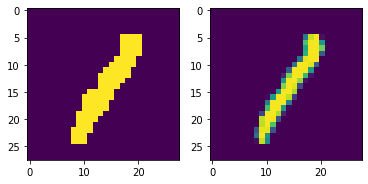

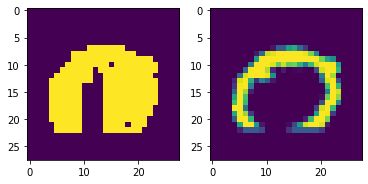

In [ ]:
imgs = [no1[456,:,:],  no0[456,:,:]]
for img in imgs:
    plt.subplot(1,2,1)
    plt.imshow(getHullPixels(img))
    plt.subplot(1,2,2)
    plt.imshow(img)
    plt.show()

In [ ]:
imgs = [no1[456,:,:]]
print(imgs)

[array([[  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0, 102, 233, 253,  11,   0,   0,   0,   0,   0,
          0,   0],
       [ 

Plotting the number of hull pixels versus the digit:

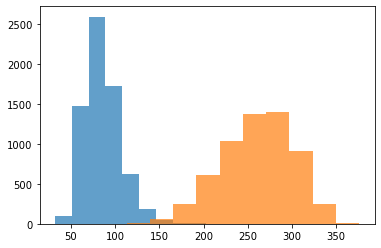

In [ ]:
hull1 = np.array([getHullPixels(i).sum() for i in no1])
hull0 = np.array([getHullPixels(i).sum() for i in no0])

plt.hist(hull1, alpha=0.7);
plt.hist(hull0, alpha=0.7);

Let us try one more feature, where we look at the number of boundary pixels in each image.

In [ ]:
def minus(a, b):
    return a & ~ b

def getBoundaryPixels(img):
    img = img.copy()>0  # binarize the image
    rshift = np.roll(img, 1, 1)
    lshift = np.roll(img, -1 ,1)
    ushift = np.roll(img, -1, 0)
    dshift = np.roll(img, 1, 0)
    boundary = minus(img, rshift) | minus(img, lshift) | minus(img, ushift) | minus(img, dshift)
    return boundary

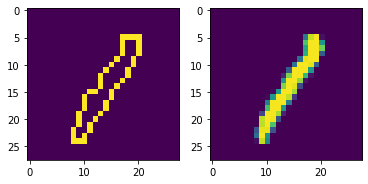

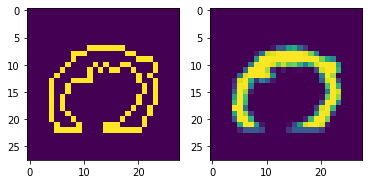

In [ ]:
imgs = [no1[456,:,:],  no0[456,:,:]]
for img in imgs:
    plt.subplot(1,2,1)
    plt.imshow(getBoundaryPixels(img))
    plt.subplot(1,2,2)
    plt.imshow(img)
    plt.show()

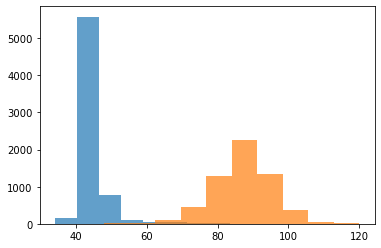

In [ ]:
bound1 = np.array([getBoundaryPixels(i).sum() for i in no1])
bound0= np.array([getBoundaryPixels(i).sum() for i in no0])

plt.hist(bound1, alpha=0.7);
plt.hist(bound0, alpha=0.7);

What will happen if we plot two features together? 

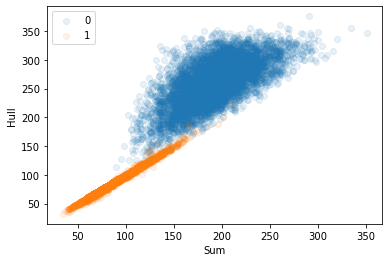

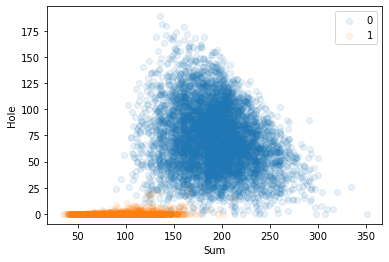

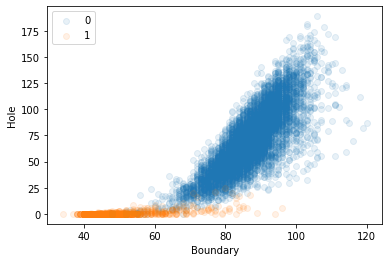

In [ ]:
# Sum and hull
plt.scatter(sum0, hull0, alpha=0.1)
plt.scatter(sum1, hull1, alpha=0.1)
plt.xlabel('Sum')
plt.ylabel('Hull')
plt.legend(['0','1'])
plt.show()

# Sum and hole
plt.scatter(sum0, hole0, alpha=0.1)
plt.scatter(sum1, hole1, alpha=0.1)
plt.xlabel('Sum');
plt.ylabel('Hole');
plt.legend(['0','1'])
plt.show()

# Hole and boundary
plt.scatter(bound0, hole0, alpha=0.1)
plt.scatter(bound1, hole1, alpha=0.1)
plt.xlabel('Boundary');
plt.ylabel('Hole');
plt.legend(['0','1'])
plt.show()

Now let us try plotting 3 features together.

In [ ]:
cl1 = ['class 1']*len(sum1)
cl0 = ['class 0']*len(sum0)
df = pd.DataFrame(list(zip(np.concatenate((hole0, hole0)), np.concatenate((sum1,sum0)), 
                           np.concatenate((bound1,bound0)), np.concatenate((cl1, cl0)))),
               columns =['Hole', 'Sum', 'Boundary', 'Class'])
df.head()
fig = px.scatter_3d(df, x='Hole', y='Sum', z='Boundary', color='Class', opacity=0.1)
fig.show()

In [ ]:
# This has three features, Hole Hull and Boundary 

cl1 = ['class 1']*len(sum1)
cl0 = ['class 0']*len(sum0)
df = pd.DataFrame(list(zip(np.concatenate((hole0, hole0)), np.concatenate((hull1,hull0)), 
                           np.concatenate((bound1,bound0)), np.concatenate((cl1, cl0)))),
               columns =['Hole', 'Hull', 'Boundary', 'Class'])
df.head()
fig = px.scatter_3d(df, x='Hole', y='Hull', z='Boundary', color='Class', opacity=0.1)
fig.show()

In [ ]:
# This has three features, Hole Hull and Sum

cl1 = ['class 1']*len(sum1)
cl0 = ['class 0']*len(sum0)
df = pd.DataFrame(list(zip(np.concatenate((hole0, hole0)), np.concatenate((hull1,hull0)), 
                           np.concatenate((sum1,sum0)), np.concatenate((cl1, cl0)))),
               columns =['Hole', 'Hull', 'Sum', 'Class'])
df.head()
fig = px.scatter_3d(df, x='Hole', y='Hull', z='Sum', color='Class', opacity=0.1)
fig.show()

In [ ]:
# This has three features, Hole Hull and Sum

cl1 = ['class 1']*len(sum1)
cl0 = ['class 0']*len(sum0)
df = pd.DataFrame(list(zip(np.concatenate((bound1,bound0)), np.concatenate((hull1,hull0)), 
                           np.concatenate((sum1,sum0)), np.concatenate((cl1, cl0)))),
               columns =['Boundary', 'Hull', 'Sum', 'Class'])
df.head()
fig = px.scatter_3d(df, x='Boundary', y='Hull', z='Sum', color='Class', opacity=0.1)
fig.show()

Feel free to explore the above graph with your mouse. 


We have seen that we extracted four features from a 28*28 dimensional image.


Some questions to explore:
1. Which is the best combination of features?
2. How would you test or visualize four or more features?
3. Can you come up with your own features?
4. Will these features work for different classes other than 0 and 1?
5. What will happen if we take more that two classes at a time?

In [ ]:
# Answer to the above questions

1. Which is the best combination of features?

Ans: Boundary, Hull, and Sum was found be best combination of features from the 3d scatter plot to classify between 
    0 and 1 images 
    
2. How would you test or visualize four or more features?
 We can use 4D plot to visualize four features. We can visualize them using heat map (learnt from the google by browsing)

3. Can you come up with your own features?

Yes, we can apply for possible transformations learnt sofar on the images without changing the context of the visualization


4. Will these features work for different classes other than 0 and 1?

We cannot persume it now, we need to try it out 

5. What will happen if we take more that two classes at a time?

It becomes a multiclass problem and the computation will become more intense, we might end up in adding more features 
better results
